In [2]:
from clustering_functions import tsne, plot_samples, k_means, plot_kmeans_params
import numpy as np
import matplotlib.pyplot as plt

In [3]:
not_pretrained = np.load('resnet18_not_pretrained_epoch=139.npy')
pretrained = np.load('resnet18_pretrained_epoch=50.npy')
resnet = np.load('resnet18.npy')

embs = [not_pretrained, pretrained, resnet]
embs_name = ['BYOL with not pretrained resnet', 'BYOL with pretrained resnet', 'Resnet after average pooling']

# K-Means

### Number of clusters vs average distance from centroids

In [3]:
n_clusters = np.arange(10, 201, 10)

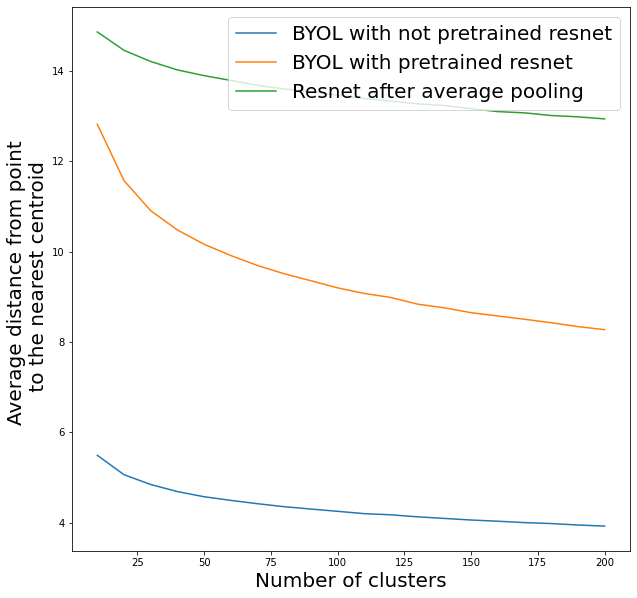

In [7]:
plt.figure(figsize=(10, 10))
for i, emb in enumerate(embs):
    plot_kmeans_params(emb, n_clusters, embs_name[i]) 
plt.legend(loc=1, fontsize=20)
plt.xlabel('Number of clusters', fontsize=20)
plt.ylabel('Average distance from point \n to the nearest centroid', fontsize=20)
plt.show()

### T-SNE and sampling

In [5]:
N_CLUSTERS = [5, 10, 20]

In [6]:
def plot_tsne(embs, name, n_clusters=N_CLUSTERS):
    plt.figure(figsize=(30, 10))
    for i, cl in enumerate(n_clusters):
        plt.subplot(1, len(n_clusters), i + 1)
        labels = k_means(embs, cl)
        tsne(embs, labels, name)

#### BYOL with not pretrained resnet18 

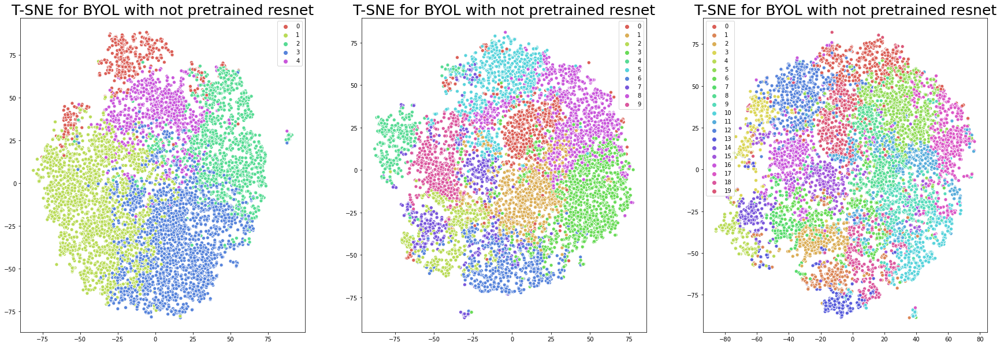

In [6]:
plot_tsne(not_pretrained, embs_name[0])

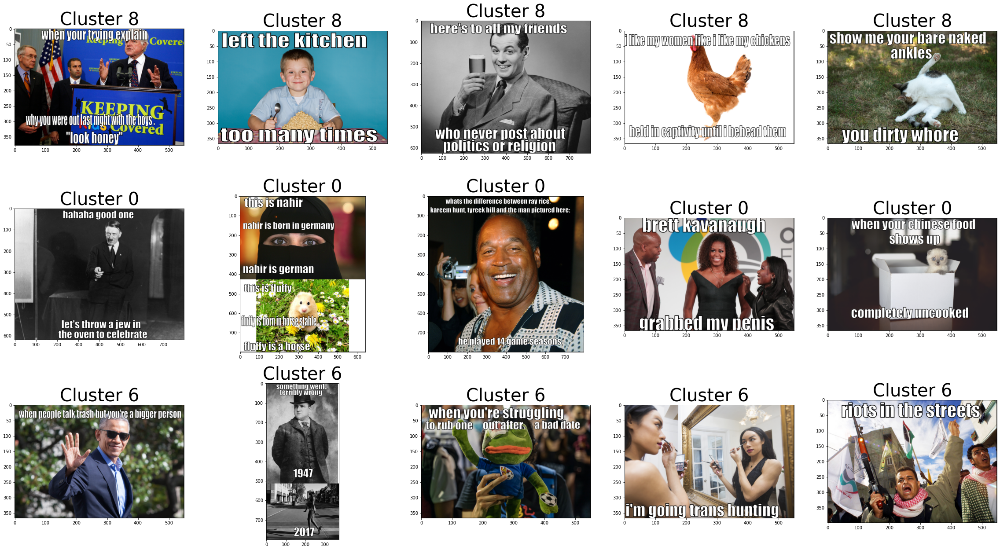

In [7]:
n_clusters = 10
labels = k_means(not_pretrained, n_clusters)
plot_samples(labels)

#### BYOL with pretrained resnet18 

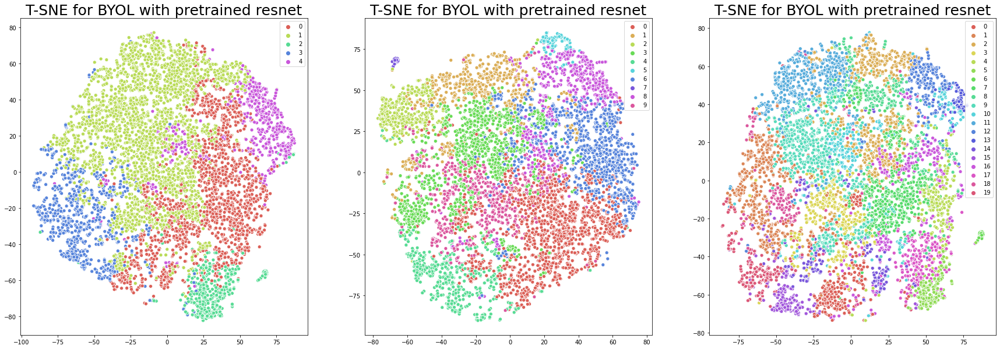

In [7]:
plot_tsne(pretrained, embs_name[1])

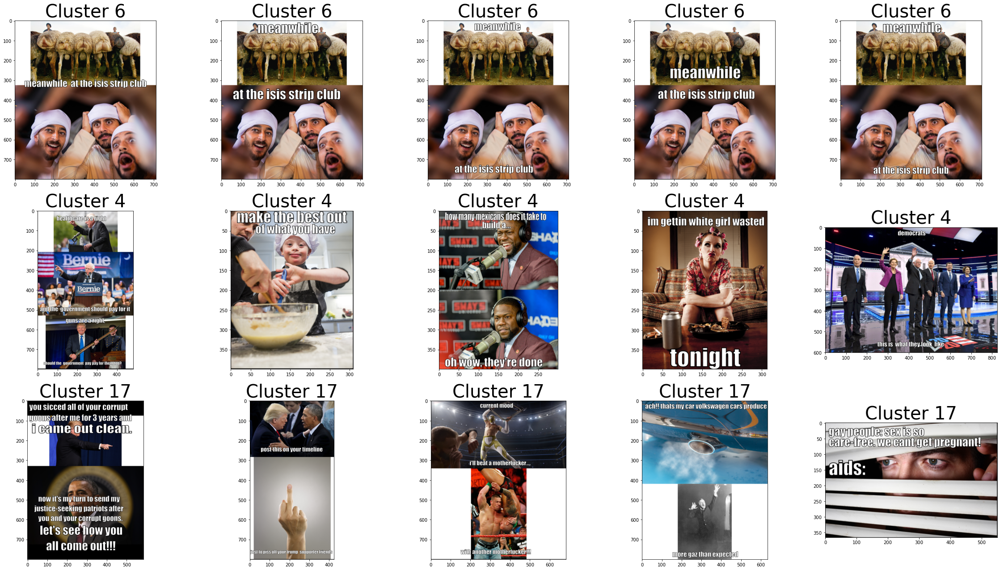

In [8]:
n_clusters = 20
labels = k_means(pretrained, n_clusters)
plot_samples(labels)

#### Resnet18

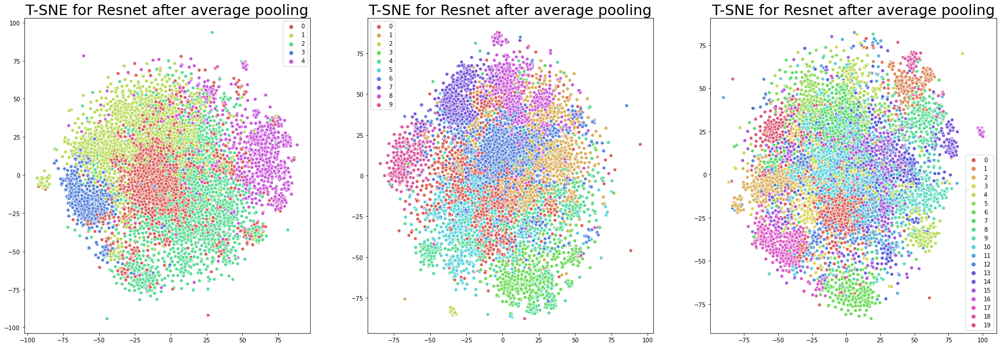

In [9]:
plot_tsne(resnet, embs_name[2])

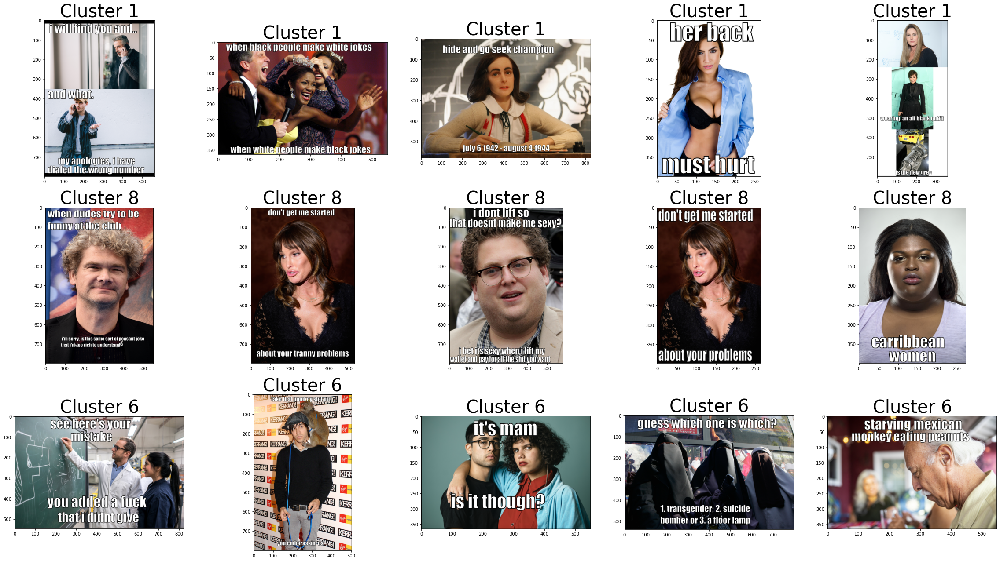

In [10]:
n_clusters = 10
labels = k_means(resnet, n_clusters)
plot_samples(labels)